In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', None)

sns.set_theme()
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler

from statsmodels.tools.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import train_test_split

from sklearn.linear_model import Ridge, Lasso, BayesianRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

import optuna

import math

In [2]:
# train = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/train.csv')
# test = pd.read_csv('/kaggle/input/house-prices-advanced-regression-techniques/test.csv')
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

<Axes: >

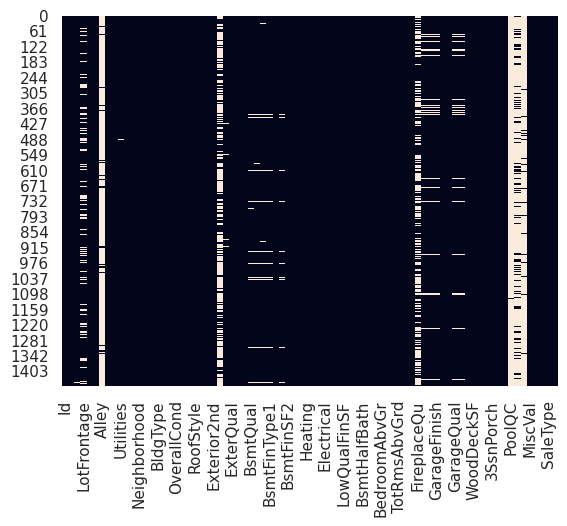

In [3]:
sns.heatmap(test.isna(), cbar = False)

In [4]:
train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,

In [5]:
test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Unf,0.0,Unf,0.0,546.0,546.0,GasA,Gd,Y,SBrkr,546,546,0,1092,0.0,0.0,1,1,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,252.0,Unf,0.0,294.0,546.0,GasA,TA,Y,SBrkr,546,546,0,1092,0.0,0.0,1,1,3,1,TA,6,Typ,0,NaN,CarPort,1970.0,Unf,1.0,286.0,TA,TA,Y,0,24,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,ALQ,1224.0,Unf,0.0,0.0,1224.0,GasA,Ex,Y,SBrkr,1224,0,0,1224,1.0,0.0,1,0,4,1,TA,7,Typ,1,TA,Detchd,1960.0,Unf,2.0,576.0,TA,TA,Y,474,0,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,5,5,1992,1992,Gable,CompShg,Hd

In [6]:
train.duplicated().sum()

0

In [7]:
test.duplicated().sum()

0

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

In [10]:
pd.set_option('display.max_rows', None)
train.isna().sum()/len(train) * 100

Id                0.000000
MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
Alley            93.767123
LotShape          0.000000
LandContour       0.000000
Utilities         0.000000
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.000000
Exterior2nd       0.000000
MasVnrType       59.726027
MasVnrArea        0.547945
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          2.534247
BsmtCond          2.534247
BsmtExposure      2.602740
BsmtFinType1      2.534247
BsmtFinSF1        0.000000
BsmtFinType2      2.602740
BsmtFinSF2        0.000000
B

In [11]:
test.isna().sum()/len(test) * 100

Id                0.000000
MSSubClass        0.000000
MSZoning          0.274160
LotFrontage      15.558602
LotArea           0.000000
Street            0.000000
Alley            92.666210
LotShape          0.000000
LandContour       0.000000
Utilities         0.137080
LotConfig         0.000000
LandSlope         0.000000
Neighborhood      0.000000
Condition1        0.000000
Condition2        0.000000
BldgType          0.000000
HouseStyle        0.000000
OverallQual       0.000000
OverallCond       0.000000
YearBuilt         0.000000
YearRemodAdd      0.000000
RoofStyle         0.000000
RoofMatl          0.000000
Exterior1st       0.068540
Exterior2nd       0.068540
MasVnrType       61.274846
MasVnrArea        1.028101
ExterQual         0.000000
ExterCond         0.000000
Foundation        0.000000
BsmtQual          3.015764
BsmtCond          3.084304
BsmtExposure      3.015764
BsmtFinType1      2.878684
BsmtFinSF1        0.068540
BsmtFinType2      2.878684
BsmtFinSF2        0.068540
B

In [12]:
pd.reset_option('display.max_rows')

In [13]:
test_ids = test['Id']

In [14]:
train.drop(columns = ['Id', 'MiscFeature', 'Fence', 'PoolQC', 'FireplaceQu', 'MasVnrType', 'Alley', 'LotFrontage'], axis = 1, inplace = True)
test.drop(columns = ['Id', 'MiscFeature', 'Fence', 'PoolQC', 'FireplaceQu', 'MasVnrType', 'Alley', 'LotFrontage'], axis = 1, inplace = True)

In [15]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0
BsmtUnfSF,1460.0,567.240411,441.866955,0.0,223.00,477.5,808.00,2336.0


In [16]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1459.0,57.378341,42.746880,20.0,20.00,50.0,70.00,190.0
LotArea,1459.0,9819.161069,4955.517327,1470.0,7391.00,9399.0,11517.50,56600.0
OverallQual,1459.0,6.078821,1.436812,1.0,5.00,6.0,7.00,10.0
OverallCond,1459.0,5.553804,1.113740,1.0,5.00,5.0,6.00,9.0
YearBuilt,1459.0,1971.357779,30.390071,1879.0,1953.00,1973.0,2001.00,2010.0
YearRemodAdd,1459.0,1983.662783,21.130467,1950.0,1963.00,1992.0,2004.00,2010.0
MasVnrArea,1444.0,100.709141,177.625900,0.0,0.00,0.0,164.00,1290.0
BsmtFinSF1,1458.0,439.203704,455.268042,0.0,0.00,350.5,753.50,4010.0
BsmtFinSF2,1458.0,52.619342,176.753926,0.0,0.00,0.0,0.00,1526.0
BsmtUnfSF,1458.0,554.294925,437.260486,0.0,219.25,460.0,797.75,2140.0


In [17]:
train.describe(exclude = np.number).T

,count,unique,top,freq
MSZoning,1460,5,RL,1151
Street,1460,2,Pave,1454
LotShape,1460,4,Reg,925
LandContour,1460,4,Lvl,1311
Utilities,1460,2,AllPub,1459
LotConfig,1460,5,Inside,1052
LandSlope,1460,3,Gtl,1382
Neighborhood,1460,25,NAmes,225
Condition1,1460,9,Norm,1260
Condition2,1460,8,Norm,1445


In [18]:
test.describe(exclude = np.number).T

,count,unique,top,freq
MSZoning,1455,5,RL,1114
Street,1459,2,Pave,1453
LotShape,1459,4,Reg,934
LandContour,1459,4,Lvl,1311
Utilities,1457,1,AllPub,1457
LotConfig,1459,5,Inside,1081
LandSlope,1459,3,Gtl,1396
Neighborhood,1459,25,NAmes,218
Condition1,1459,9,Norm,1251
Condition2,1459,5,Norm,1444


In [19]:
numeric_train_df = train.select_dtypes(include = np.number)
numeric_test_df = test.select_dtypes(include = np.number)

In [20]:
numeric_cols = numeric_train_df.columns

In [21]:
cat_train_df = train.select_dtypes(include = 'object')
cat_test_df = test.select_dtypes(include = 'object')

In [22]:
cat_cols = cat_train_df.columns

In [23]:
def draw_distplot(dataset, variables, n_rows, n_cols):
    fig = plt.figure(figsize=(26,20), dpi = 200)
    fig.suptitle('Distribution of Numerical Features', fontsize=24)

    # Custom color palette for better aesthetics
    colors = sns.color_palette("husl", n_colors=36)
    for i, var_name in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        sns.distplot(x = dataset[var_name], bins=10, color=colors[i], ax=ax)
        ax.set_title(var_name + " Distribution")
        
        # Add a vertical line at the mean
        mean_value = np.mean(dataset[var_name])
        ax.axvline(mean_value, color='darkred', linestyle='dashed', linewidth=2, label='Mean', alpha=0.8)
        
        # Add legend
        ax.legend(loc='best')
    fig.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

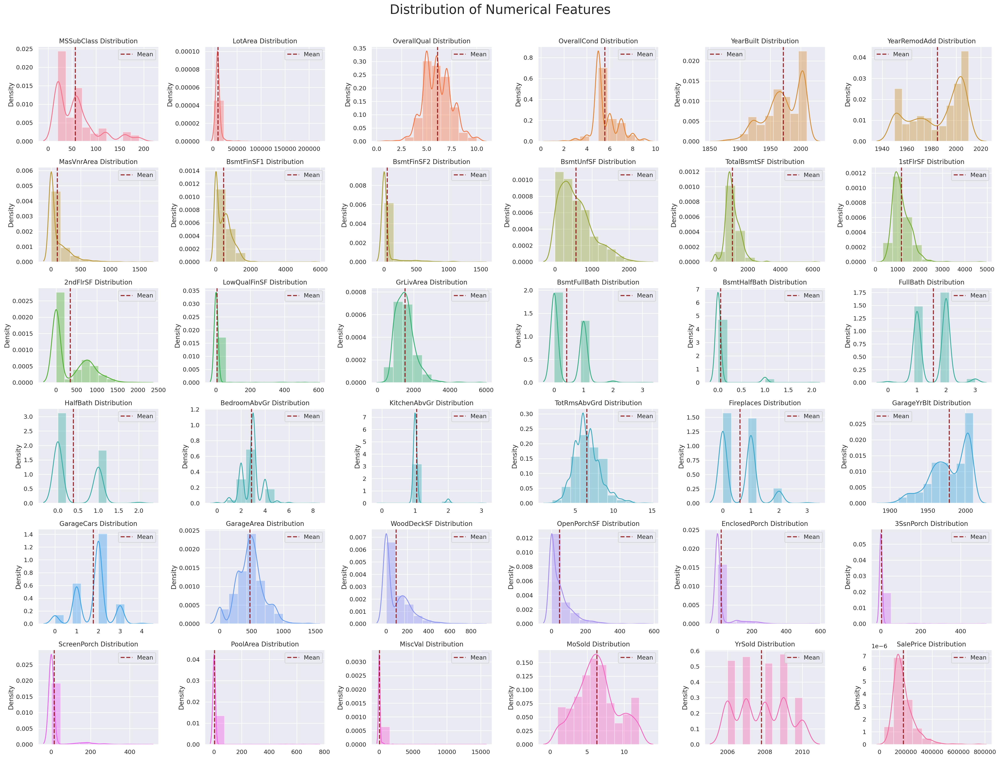

In [25]:
draw_distplot(numeric_train_df, numeric_cols, 6, 6)

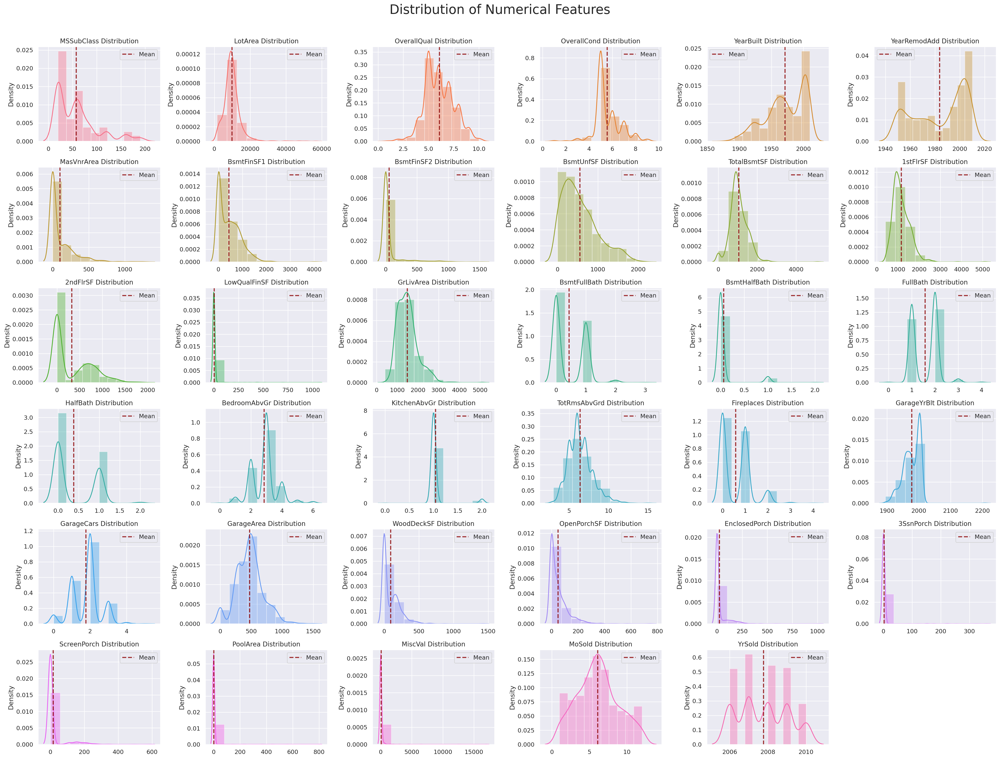

In [38]:
draw_distplot(numeric_test_df, numeric_cols[:-1], 6, 6)

In [39]:
def draw_boxplot(dataset, variables, n_rows, n_cols):
    fig = plt.figure(figsize=(32,26), dpi = 200)
    fig.suptitle('Boxplot of Numerical Features', fontsize=24)

    # Custom color palette for better aesthetics
    colors = sns.color_palette("summer", n_colors=36)
    for i, var_name in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        sns.boxplot(x = dataset[var_name], color=colors[i], ax=ax)
        ax.set_title(var_name + " Distribution")
        
        # Add a vertical line at the mean
        mean_value = np.mean(dataset[var_name])
        ax.axvline(mean_value, color='darkred', linestyle='dashed', linewidth=2, label='Mean', alpha=0.8)
        
        # Add legend
        ax.legend(loc='best')
    fig.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

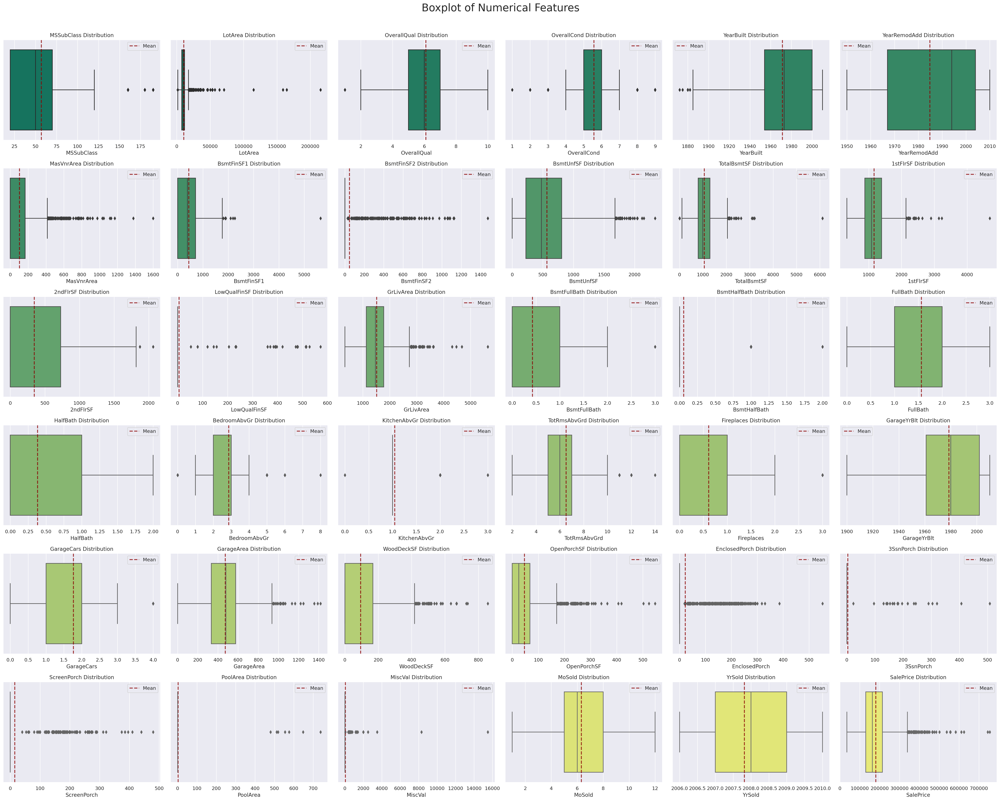

In [40]:
draw_boxplot(numeric_train_df, numeric_cols, 6, 6)

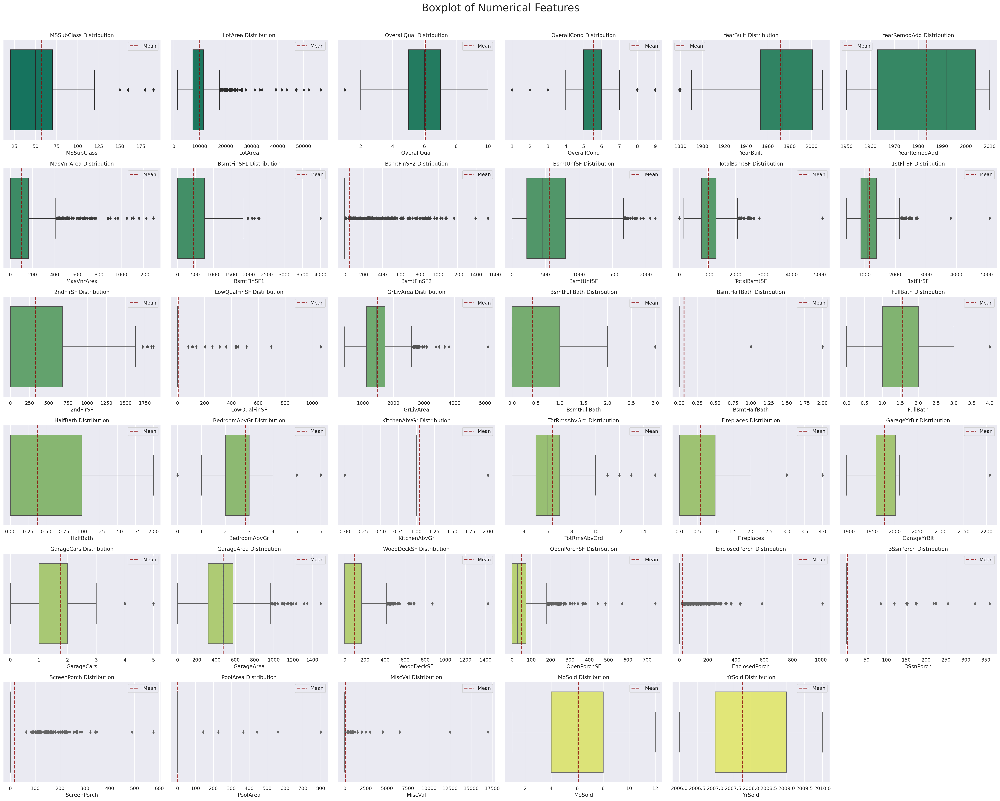

In [41]:
draw_boxplot(numeric_test_df, numeric_cols[:-1], 6, 6)

In [ ]:
def draw_scatterplot(dataset, variables, n_rows, n_cols):
    fig = plt.figure(figsize=(32,26), dpi = 200)
    fig.suptitle('Boxplot of Numerical Features', fontsize=24)

    # Custom color palette for better aesthetics
    colors = sns.color_palette("winter", n_colors=36)
    for i, var_name in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        sns.scatterplot(x = dataset.index,y = dataset[var_name], color=colors[i], ax=ax)
        ax.set_title(var_name + " Distribution")
        
        # Add legend
        ax.legend(loc='best')
        
    fig.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

In [ ]:
draw_scatterplot(train, numeric_cols, 6, 6)

In [ ]:
draw_scatterplot(test, numeric_cols[:-1], 6, 6)

#### Z - Score method

In [ ]:
# # capping method
# def remove_outliers(dataset, variables):
#     for i , var_name in enumerate(variables):
#         upper_limit = dataset[var_name].mean() + 3 * dataset[var_name].std()
#         lower_limit = dataset[var_name].mean() - 3 * dataset[var_name].std()
#         print('Variable Name: ',var_name)
#         print('Upper Limit: ',upper_limit)
#         print('Lower Limit: ',lower_limit)
#         print('* ' * 20)
        
#         dataset[var_name] = np.where(dataset[var_name] > upper_limit, upper_limit, np.where(dataset[var_name] < lower_limit, lower_limit, dataset[var_name]))

In [ ]:
# # capping the values to remove outliers
# remove_outliers(train, numeric_cols)

In [48]:
# draw_scatterplot(train, numeric_cols, 6, 6)

In [49]:
# remove_outliers(test, numeric_cols[:-1])

In [50]:
# draw_scatterplot(test, numeric_cols[:-1], 6, 6)

#### Iqr outlier remover

In [51]:
# capping method
def remove_outliers(dataset, variables):
    for i , var_name in enumerate(variables):
        q1 = dataset[var_name].quantile(0.25)
        q3 = dataset[var_name].quantile(0.75)
        iqr = q3 - q1
        upper_limit = q3 + 1.5*iqr
        lower_limit = q1 - 1.5*iqr
        print('Variable Name: ',var_name)
        print('Q1: ',q1)
        print('Q3: ',q3)
        print('IQR: ',iqr)
        print('Upper Limit: ',upper_limit)
        print('Lower Limit: ',lower_limit)
        print('* ' * 20)
        
        dataset[var_name] = np.where(dataset[var_name] > upper_limit, upper_limit, np.where(dataset[var_name] < lower_limit, lower_limit, dataset[var_name]))

In [52]:
remove_outliers(train, numeric_cols)

Variable Name:  MSSubClass
Q1:  20.0
Q3:  70.0
IQR:  50.0
Upper Limit:  145.0
Lower Limit:  -55.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  LotArea
Q1:  7553.5
Q3:  11601.5
IQR:  4048.0
Upper Limit:  17673.5
Lower Limit:  1481.5
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  OverallQual
Q1:  5.0
Q3:  7.0
IQR:  2.0
Upper Limit:  10.0
Lower Limit:  2.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  OverallCond
Q1:  5.0
Q3:  6.0
IQR:  1.0
Upper Limit:  7.5
Lower Limit:  3.5
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  YearBuilt
Q1:  1954.0
Q3:  2000.0
IQR:  46.0
Upper Limit:  2069.0
Lower Limit:  1885.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  YearRemodAdd
Q1:  1967.0
Q3:  2004.0
IQR:  37.0
Upper Limit:  2059.5
Lower Limit:  1911.5
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  MasVnrArea
Q1:  0.0
Q3:  166.0
IQR:  166.0
Upper Limit:  415.0
Lower Limit:  -249.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  

In [53]:
remove_outliers(test, numeric_cols[:-1])

Variable Name:  MSSubClass
Q1:  20.0
Q3:  70.0
IQR:  50.0
Upper Limit:  145.0
Lower Limit:  -55.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  LotArea
Q1:  7391.0
Q3:  11517.5
IQR:  4126.5
Upper Limit:  17707.25
Lower Limit:  1201.25
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  OverallQual
Q1:  5.0
Q3:  7.0
IQR:  2.0
Upper Limit:  10.0
Lower Limit:  2.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  OverallCond
Q1:  5.0
Q3:  6.0
IQR:  1.0
Upper Limit:  7.5
Lower Limit:  3.5
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  YearBuilt
Q1:  1953.0
Q3:  2001.0
IQR:  48.0
Upper Limit:  2073.0
Lower Limit:  1881.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  YearRemodAdd
Q1:  1963.0
Q3:  2004.0
IQR:  41.0
Upper Limit:  2065.5
Lower Limit:  1901.5
* * * * * * * * * * * * * * * * * * * * 
Variable Name:  MasVnrArea
Q1:  0.0
Q3:  164.0
IQR:  164.0
Upper Limit:  410.0
Lower Limit:  -246.0
* * * * * * * * * * * * * * * * * * * * 
Variable Name:

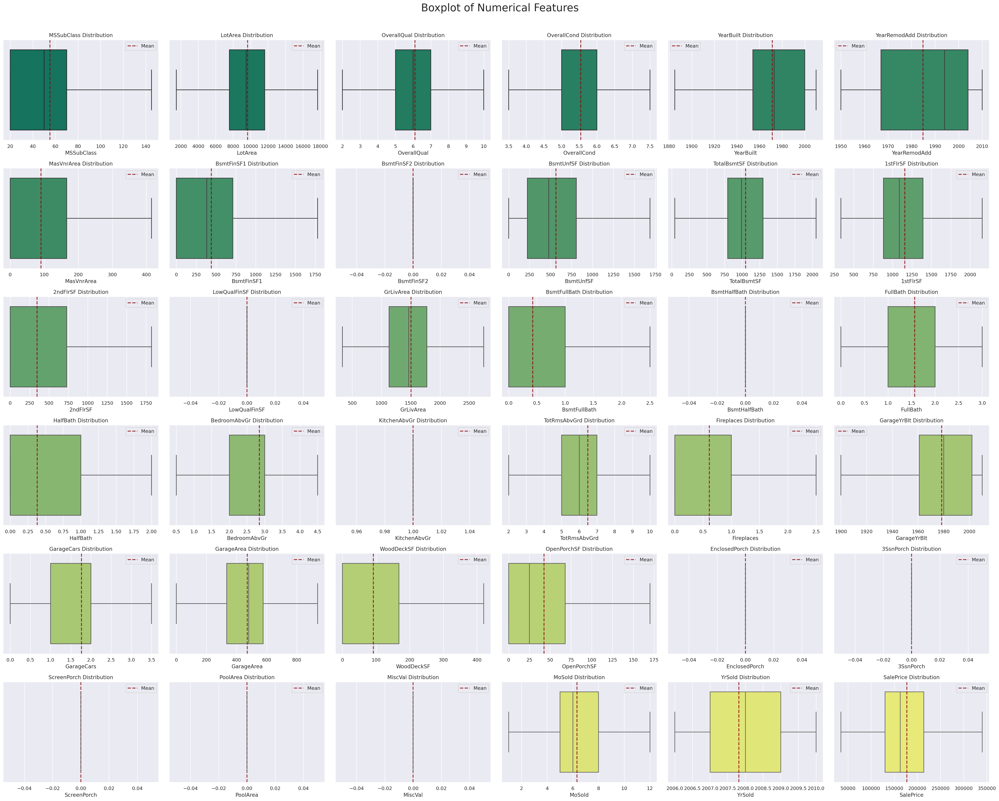

In [54]:
draw_boxplot(train, numeric_cols, 6, 6)

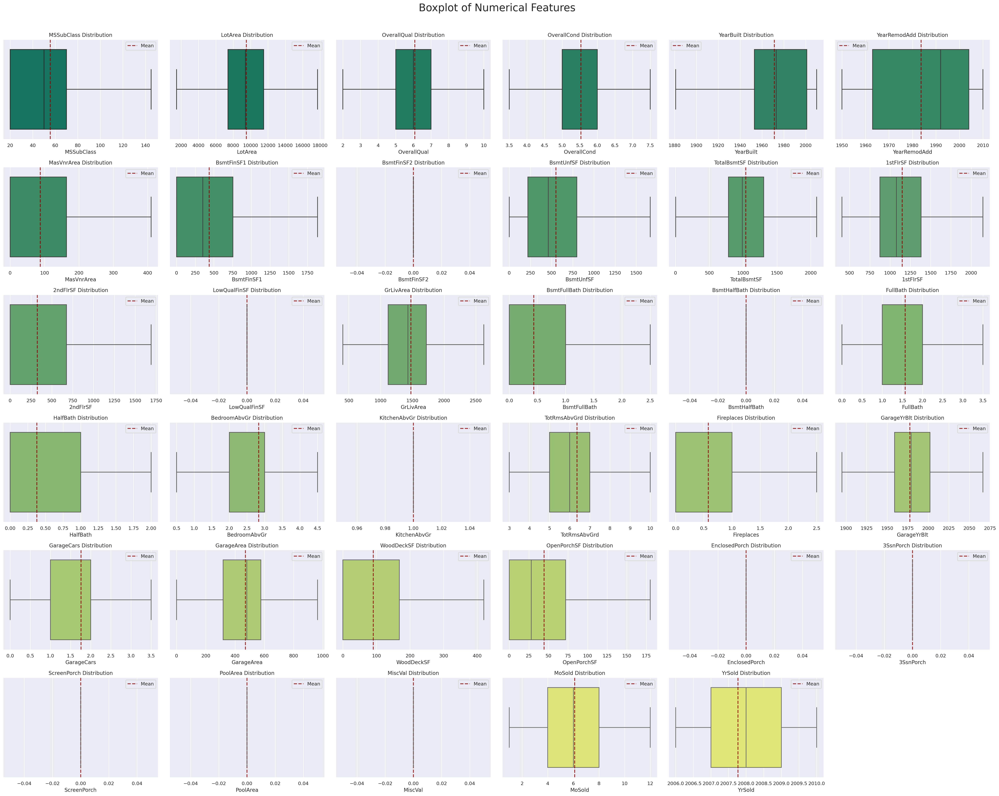

In [55]:
draw_boxplot(test, numeric_cols[:-1], 6, 6)

In [56]:
def draw_countplot(dataset, variables, n_rows, n_cols):
    fig = plt.figure(figsize=(36, 30), dpi = 200)
    fig.suptitle('Barplot for Categorical Features', fontsize = 24)
    
    colors = sns.color_palette('pastel', n_colors = 37)
    for i, var_name in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i + 1)
        sns.countplot(x = dataset[var_name], color=colors[i], ax = ax)
        ax.set_title(var_name + ' Distribution')
        
        ax.legend(loc = 'best')
    plt.tight_layout(rect = [0, 0, 1, 0.97])
    plt.show()

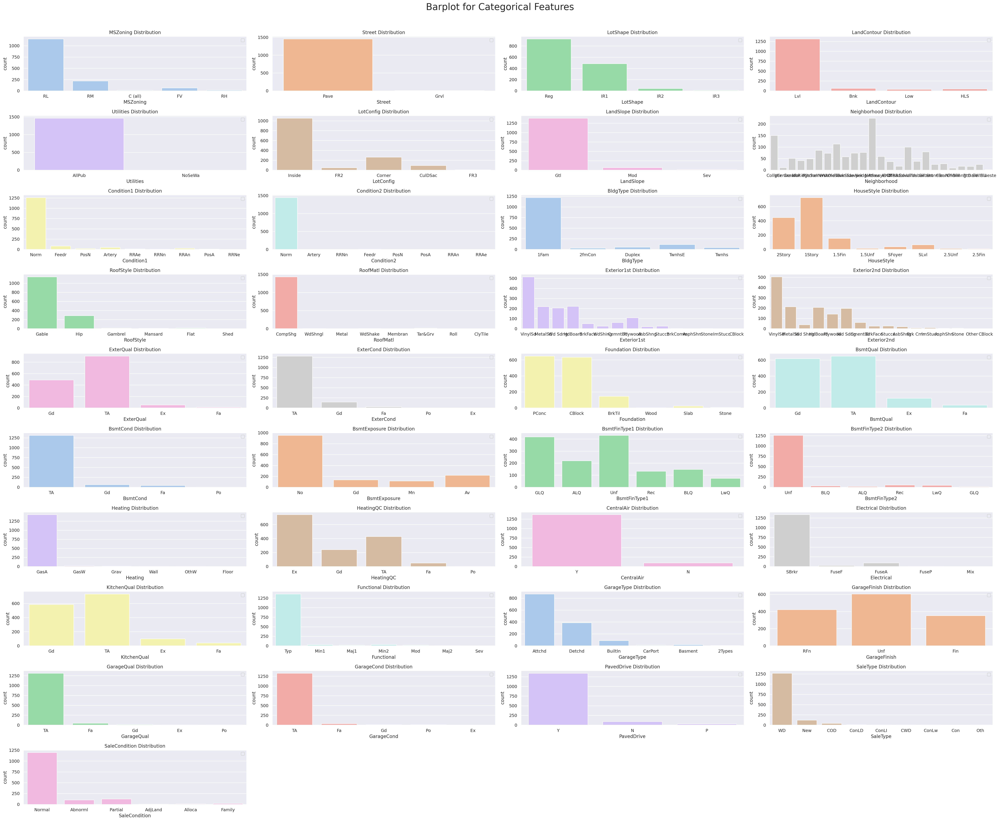

In [57]:
draw_countplot(train, cat_cols, 10, 4)

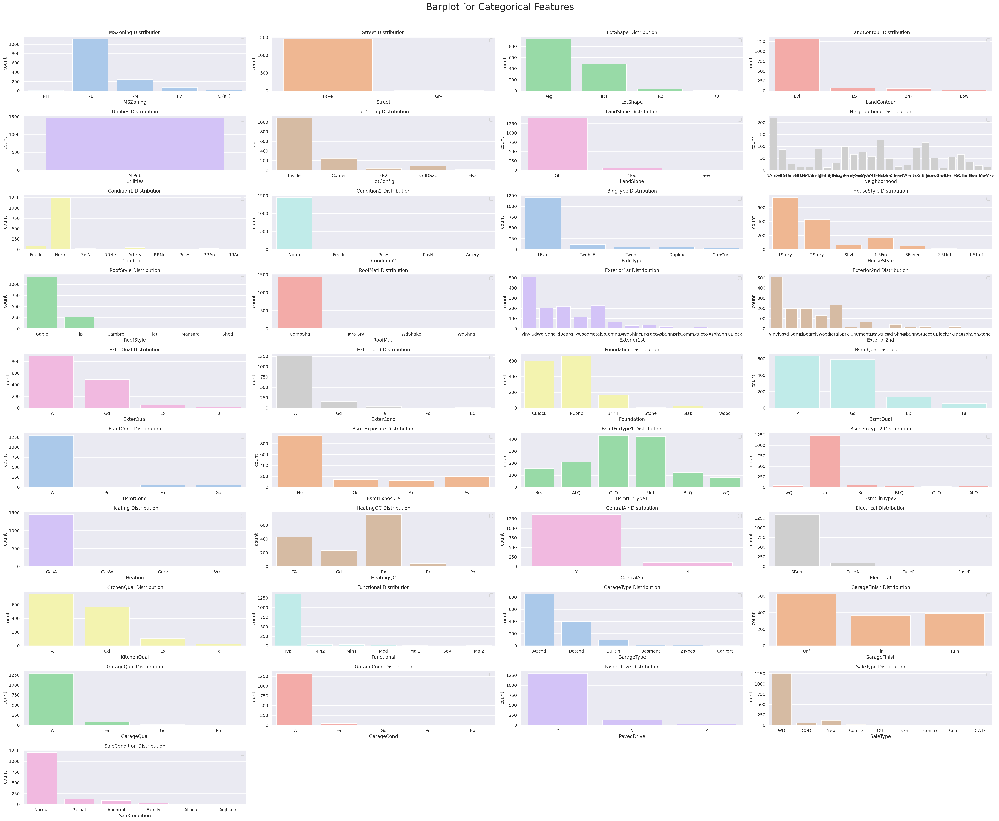

In [58]:
draw_countplot(test, cat_cols, 10, 4)

In [59]:
def bivariate_analysis_for_numeric(dataset, variables, n_rows, n_cols):
    fig = plt.figure(figsize = (36, 30), dpi = 200)
    fig.suptitle('Bivariate Analysis for numeric variables with Target Variable', fontsize = 24)
    
    colors = sns.color_palette('cool', n_colors = 36)
    for i, var_name in enumerate(variables):
        ax = fig.add_subplot(n_rows, n_cols, i + 1)
        sns.scatterplot(x = var_name, y = 'SalePrice', data = dataset, color=colors[i], ax = ax)
        ax.set_title(var_name + ' vs SalePrice Distribution')
        ax.legend(loc = 'best')
    plt.tight_layout(rect = [0, 0, 1, 0.97])
    plt.show()

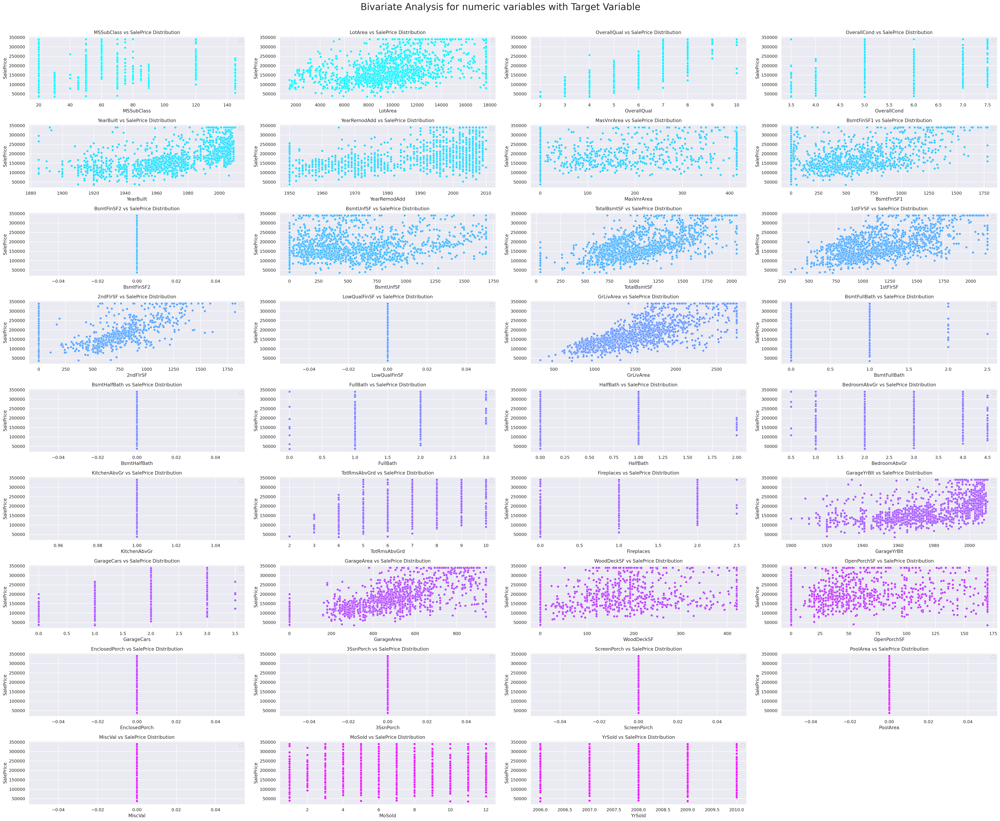

In [60]:
bivariate_analysis_for_numeric(train, numeric_cols[: -1], 9, 4)

<Axes: >

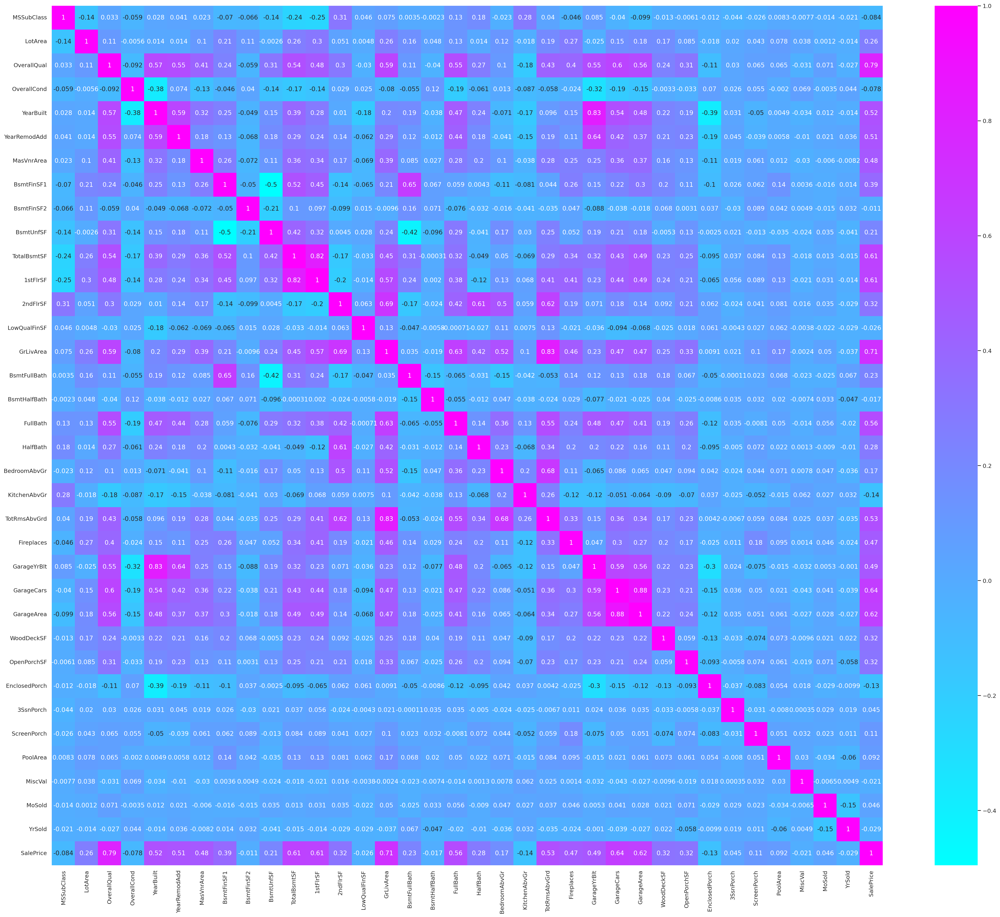

In [61]:
plt.figure(figsize=(36, 30), dpi = 200)
sns.heatmap(numeric_train_df.corr(), annot = True, cbar = True, cmap = 'cool')

In [62]:
x = train.iloc[:, :-1]
y = train.iloc[:, -1]

In [63]:
x_train, x_val, y_train, y_val = train_test_split(x, y, test_size=0.25, random_state = 101)

In [64]:
x_train = x_train.reset_index()
x_val = x_val.reset_index()
y_train = y_train.reset_index()
y_val = y_val.reset_index()

x_train.drop(['index'], axis = 1, inplace = True)
x_val.drop(['index'], axis = 1, inplace = True)
y_train.drop(['index'], axis = 1, inplace = True)
y_val.drop(['index'], axis = 1, inplace = True)

<Axes: >

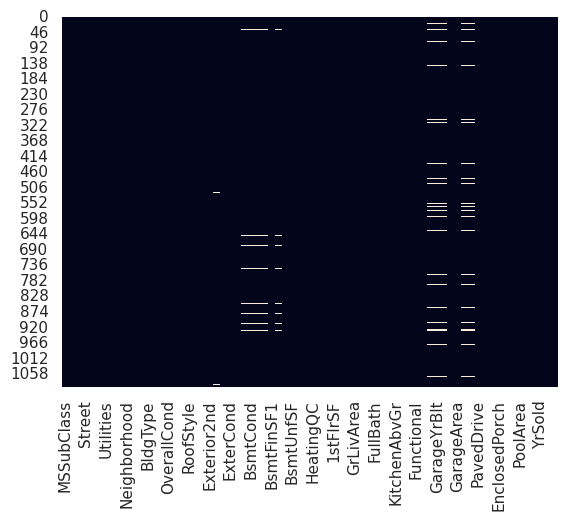

In [65]:
sns.heatmap(x_train.isna(), cbar = False)

<Axes: >

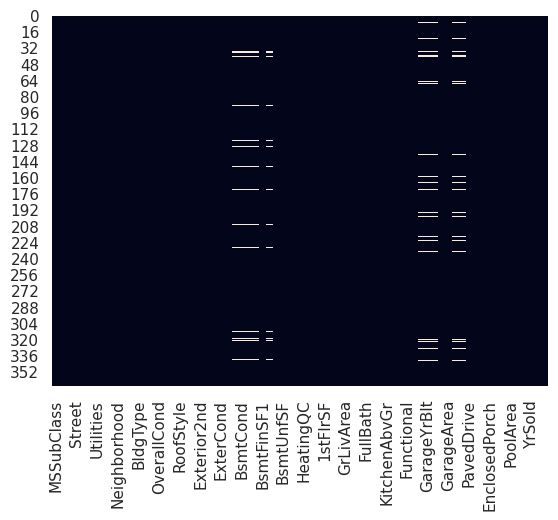

In [66]:
sns.heatmap(x_val.isna(), cbar = False)

<Axes: >

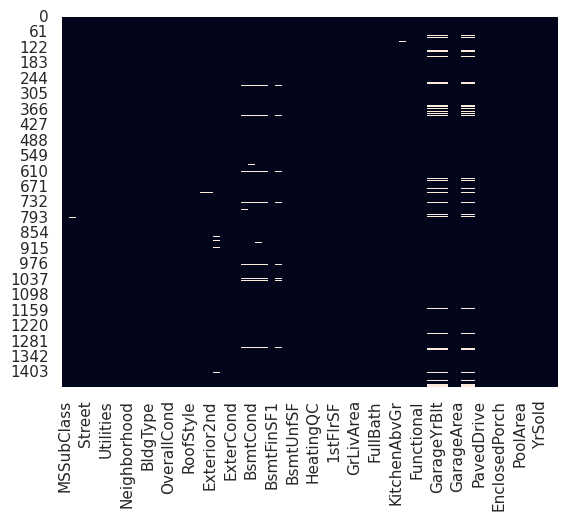

In [67]:
sns.heatmap(test.isna(), cbar = False)

In [68]:
for i in x_train.select_dtypes(include = np.number).columns:
    x_train[i] = x_train[i].fillna(x_train[i].mean())
for i in test.select_dtypes(include = np.number).columns:
    x_val[i] = x_val[i].fillna(x_val[i].mean())
    test[i] = test[i].fillna(test[i].mean())

In [69]:
for i in x_train.select_dtypes(include = ['object']).columns:
    x_train[i] = x_train[i].fillna(x_train[i].mode())
for i in test.select_dtypes(include = ['object']).columns:
    x_val[i] = x_val[i].fillna(x_val[i].mode())
    test[i] = test[i].fillna(test[i].mode())

In [158]:
# for i in x_train.columns:
#     print("* "* 30)
#     print(i)
#     print(x_train[i].unique())

In [72]:
# test[test.isnull().any(axis=1)]

In [73]:
x_val['GarageType'] = x_val['GarageType'].replace([np.nan], x_val['GarageType'].mode())
x_val['BsmtQual'] = x_val['BsmtQual'].replace([np.nan], x_val['BsmtQual'].mode())
x_val['BsmtCond'] = x_val['BsmtCond'].replace([np.nan], x_val['BsmtCond'].mode())
x_val['BsmtExposure'] = x_val['BsmtExposure'].replace([np.nan], x_val['BsmtExposure'].mode())
x_val['BsmtFinType1'] = x_val['BsmtFinType1'].replace([np.nan], x_val['BsmtFinType1'].mode())
x_val['BsmtFinType2'] = x_val['BsmtFinType2'].replace([np.nan], x_val['BsmtFinType2'].mode())
x_val['GarageFinish'] = x_val['GarageFinish'].replace([np.nan], x_val['GarageFinish'].mode())
x_val['GarageQual'] = x_val['GarageQual'].replace([np.nan], x_val['GarageQual'].mode())
x_val['GarageCond'] = x_val['GarageCond'].replace([np.nan], x_val['GarageCond'].mode())

In [74]:
x_train['BsmtQual'] = x_train['BsmtQual'].replace([np.nan], x_train['BsmtQual'].mode())
x_train['BsmtCond'] = x_train['BsmtCond'].replace([np.nan], x_train['BsmtCond'].mode())
x_train['BsmtExposure'] = x_train['BsmtExposure'].replace([np.nan], x_train['BsmtExposure'].mode())
x_train['BsmtFinType1'] = x_train['BsmtFinType1'].replace([np.nan], x_train['BsmtFinType1'].mode())
x_train['BsmtFinType2'] = x_train['BsmtFinType2'].replace([np.nan], x_train['BsmtFinType2'].mode())
x_train['Electrical'] = x_train['Electrical'].replace([np.nan], x_train['Electrical'].mode())
x_train['GarageType'] = x_train['GarageType'].replace([np.nan], x_train['GarageType'].mode())
x_train['GarageFinish'] = x_train['GarageFinish'].replace([np.nan], x_train['GarageFinish'].mode())
x_train['GarageQual'] = x_train['GarageQual'].replace([np.nan], x_train['GarageQual'].mode())
x_train['GarageCond'] = x_train['GarageCond'].replace([np.nan], x_train['GarageCond'].mode())

In [75]:
l = ['MSZoning','Utilities','Exterior1st','Exterior2nd','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','KitchenQual','Functional','GarageType','GarageFinish','GarageQual','GarageCond','SaleType']

for i in l:
    test[i] = test[i].replace([np.nan], test[i].mode())

In [76]:
pd.set_option('display.max_rows', None)
x_val.isnull().sum()/len(x_val) * 100

MSSubClass       0.0
MSZoning         0.0
LotArea          0.0
Street           0.0
LotShape         0.0
LandContour      0.0
Utilities        0.0
LotConfig        0.0
LandSlope        0.0
Neighborhood     0.0
Condition1       0.0
Condition2       0.0
BldgType         0.0
HouseStyle       0.0
OverallQual      0.0
OverallCond      0.0
YearBuilt        0.0
YearRemodAdd     0.0
RoofStyle        0.0
RoofMatl         0.0
Exterior1st      0.0
Exterior2nd      0.0
MasVnrArea       0.0
ExterQual        0.0
ExterCond        0.0
Foundation       0.0
BsmtQual         0.0
BsmtCond         0.0
BsmtExposure     0.0
BsmtFinType1     0.0
BsmtFinSF1       0.0
BsmtFinType2     0.0
BsmtFinSF2       0.0
BsmtUnfSF        0.0
TotalBsmtSF      0.0
Heating          0.0
HeatingQC        0.0
CentralAir       0.0
Electrical       0.0
1stFlrSF         0.0
2ndFlrSF         0.0
LowQualFinSF     0.0
GrLivArea        0.0
BsmtFullBath     0.0
BsmtHalfBath     0.0
FullBath         0.0
HalfBath         0.0
BedroomAbvGr 

In [77]:
pd.reset_option('display.max_rows')

In [78]:
# Scalling
# def scaling(dataframe, numeric_cols):
#     scaled_dataframe = dataframe.copy()
#     scaler = StandardScaler()
#     scaled_dataframe[numeric_cols] = scaler.fit_transform(scaled_dataframe[numeric_cols])

#     return scaled_dataframe

In [79]:
# x_train = scaling(x_train, numeric_cols[ :-1])
# x_val = scaling(x_val, numeric_cols[ :-1])
# test = scaling(test, numeric_cols[ :-1])

In [80]:
def apply_one_hot_encoding(dataset, columns):
    encoded_dataset = dataset.copy()
    for column in columns:
        encoded_columns = pd.get_dummies(encoded_dataset[column], prefix=column, dtype= int, drop_first=True)
        encoded_dataset = encoded_dataset.drop(column, axis=1)
        encoded_dataset = pd.concat([encoded_dataset, encoded_columns], axis=1)
    return encoded_dataset

In [81]:
x_train = apply_one_hot_encoding(x_train, cat_cols)
print('OHE Done for x_train')
x_val = apply_one_hot_encoding(x_val, cat_cols)
print('OHE Done for x_val')
test = apply_one_hot_encoding(test, cat_cols)
print('OHE Done for test')

OHE Done for x_train
OHE Done for x_val
OHE Done for test


In [82]:
models = {
    'ridge' : Ridge(),
    'xgboost' : XGBRegressor(),
    'catboost' : CatBoostRegressor(verbose=0),
    'lightgbm' : LGBMRegressor(),
    'gradient boosing' : GradientBoostingRegressor(),
    'lasso' : Lasso(),
    'random forest' : RandomForestRegressor(),
    'hist gb' : HistGradientBoostingRegressor(),
    'bayesian ridge' : BayesianRidge(),
    'support vector Machine': SVR(),
    'knn' : KNeighborsRegressor(n_neighbors = 3)
}

In [83]:
# x_val.drop(['Exterior1st_Stone','Functional_Sev', 'HeatingQC_Po', 'RoofMatl_CompShg'], axis = 1, inplace = True)
# x_train.drop(['BsmtCond_Po','Condition1_PosA', 'Condition1_RRNe', 'Condition2_PosA', 'Condition2_PosN'], axis = 1, inplace = True)
# test.drop(['BsmtCond_Po','Condition1_PosA', 'Condition1_RRNe', 'Condition2_PosA', 'Condition2_PosN'], axis = 1, inplace = True)

In [84]:
# x_train.drop(['Condition2_RRAe','Condition2_RRAn', 'Electrical_Mix', 'ExterCond_Fa', 'ExterCond_Po'], axis = 1, inplace = True)
# test.drop(['ExterCond_Fa', 'ExterCond_Po'], axis = 1, inplace = True)

In [85]:
# x_train.drop(['Exterior1st_AsphShn','Exterior1st_BrkComm', 'Exterior1st_CBlock', 'Exterior1st_ImStucc', 'Exterior2nd_AsphShn'], axis = 1, inplace = True)
# test.drop(['Exterior1st_AsphShn','Exterior1st_BrkComm', 'Exterior1st_CBlock', 'Exterior2nd_AsphShn'], axis = 1, inplace = True)

In [86]:
# x_train.drop(['Exterior2nd_CBlock','Exterior2nd_Other', 'Functional_Maj2', 'GarageCond_Fa', 'Heating_GasA'], axis = 1, inplace = True)
# test.drop(['Exterior2nd_CBlock', 'Functional_Maj2', 'GarageCond_Fa'], axis = 1, inplace = True)

In [87]:
# x_train.drop(['Heating_OthW','RoofMatl_Membran', 'RoofMatl_Metal', 'RoofMatl_Roll', 'RoofStyle_Shed'], axis = 1, inplace = True)
# test.drop(['RoofStyle_Shed'], axis = 1, inplace = True)

In [88]:
# x_train.drop(['SaleCondition_AdjLand','SaleType_Con', 'Street_Pave', 'Utilities_NoSeWa'], axis = 1, inplace = True)
# test.drop(['SaleCondition_AdjLand','SaleType_Con', 'Street_Pave'], axis = 1, inplace = True)

In [89]:
def create_dataframe_with_zeros(variable_names, num_rows):
    data = {}
    for var_name in variable_names:
        data[var_name] = [0] * num_rows
    df = pd.DataFrame(data)

    return df

In [90]:
variable_names = ['Exterior1st_Stone', 'Functional_Sev', 'HeatingQC_Po', 'RoofMatl_CompShg']
num_rows = 1095

df1 = create_dataframe_with_zeros(variable_names, num_rows)

In [91]:
variable_names = ['BsmtCond_Po','Condition1_PosA', 'Condition1_RRNe', 'Condition2_PosA', 'Condition2_PosN', 'Condition2_RRAe','Condition2_RRAn', 'Electrical_Mix', 'ExterCond_Fa', 'ExterCond_Po', 'Exterior1st_AsphShn','Exterior1st_BrkComm', 'Exterior1st_CBlock', 'Exterior1st_ImStucc', 'Exterior2nd_AsphShn', 'Exterior2nd_CBlock','Exterior2nd_Other', 'Functional_Maj2', 'GarageCond_Fa', 'Heating_GasA', 'Heating_OthW','RoofMatl_Membran', 'RoofMatl_Metal', 'RoofMatl_Roll', 'RoofStyle_Shed', 'SaleCondition_AdjLand','SaleType_Con', 'Street_Pave', 'Utilities_NoSeWa']
num_rows = 365

df2 = create_dataframe_with_zeros(variable_names, num_rows)

In [92]:
variable_names = ['Condition2_RRAe', 'Condition2_RRAn', 'Condition2_RRNn', 'Electrical_Mix', 'Exterior1st_ImStucc', 'Exterior1st_Stone', 'Exterior2nd_Other', 'GarageQual_Fa', 'Heating_OthW', 'Heating_GasA', 'HouseStyle_2.5Fin', 'RoofMatl_CompShg', 'RoofMatl_Membran', 'RoofMatl_Metal', 'RoofMatl_Roll', 'Utilities_NoSeWa']
num_rows = 1459

df3 = create_dataframe_with_zeros(variable_names, num_rows)

In [93]:
x_train = pd.concat([x_train, df1], axis = 1)

In [94]:
x_val = pd.concat([x_val, df2], axis = 1)

In [95]:
test = pd.concat([test, df3], axis = 1)

In [96]:
print(x_val.shape)
print(x_train.shape)

x_train_left = [elem for elem in x_val.columns if elem not in x_train.columns]
print(x_train_left)
x_val_left = [elem for elem in x_train.columns if elem not in x_val.columns]
print(x_val_left)

(365, 228)
(1095, 228)
[]
[]


In [97]:
# Assuming x_train and x_val are DataFrames
# Get the column order from the training dataset
column_order = x_train.columns

# Reorder columns in the validation dataset to match the order in the training dataset
x_val = x_val[column_order]
test = test[column_order]

In [98]:
for name, model in models.items():
    model.fit(x_train, y_train)
    print(f'{name} trained \n')

ridge trained 

xgboost trained 

catboost trained 

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2759
[LightGBM] [Info] Number of data points in the train set: 1095, number of used features: 133
[LightGBM] [Info] Start training from score 178397.003653
lightgbm trained 

gradient boosing trained 

lasso trained 

random forest trained 

hist gb trained 

bayesian ridge trained 

support vector Machine trained 

knn trained 



In [99]:
results_train = {}
for name, model in models.items():
    rmse = math.sqrt(mean_squared_error(y_train, model.predict(x_train)))
    r2 = r2_score(y_train, model.predict(x_train))
    results_train[name] = [rmse, r2]

In [100]:
print(' Training Root Mean Square Errors and R2 Score')
for name, result in results_train.items():
    print("----------------")
    print(f'{name} : {result}')

 Training Root Mean Square Errors and R2 Score
----------------
ridge : [16275.732481660254, 0.9419542869427405]
----------------
xgboost : [986.8606633169909, 0.9997865968915389]
----------------
catboost : [4960.821054297044, 0.9946074250756649]
----------------
lightgbm : [6338.409741734186, 0.9911966151971622]
----------------
gradient boosing : [12475.6591653887, 0.9658951559891751]
----------------
lasso : [16013.186603036327, 0.9438118680129749]
----------------
random forest : [8452.582709390574, 0.9843444646567584]
----------------
hist gb : [6218.779555466018, 0.9915257867414699]
----------------
bayesian ridge : [17411.36649821183, 0.9335714490039605]
----------------
support vector Machine : [68855.91840101311, -0.038894902634256434]
----------------
knn : [25983.772565216113, 0.8520573215266148]


In [101]:
results_val = {}
for name, model in models.items():
    rmse = math.sqrt(mean_squared_error(y_val, model.predict(x_val)))
    r2 = r2_score(y_val, model.predict(x_val))
    results_val[name] = [rmse, r2]

In [102]:
print(' Testing Root Mean Square Errors and R2 Score')
for name, result in results_val.items():
    print("----------------")
    print(f'{name} : {result}')

 Testing Root Mean Square Errors and R2 Score
----------------
ridge : [28011.292657050883, 0.8196078834664071]
----------------
xgboost : [22024.410196500572, 0.8884781856743296]
----------------
catboost : [19871.427048378893, 0.9092159892435746]
----------------
lightgbm : [21478.555711075987, 0.8939376119102423]
----------------
gradient boosing : [21185.425990432203, 0.8968128412450115]
----------------
lasso : [29373.311889412817, 0.8016386361773723]
----------------
random forest : [23553.386053215276, 0.8724566108441477]
----------------
hist gb : [21654.689876556782, 0.8921909574534098]
----------------
bayesian ridge : [23486.546702474418, 0.8731794641425359]
----------------
support vector Machine : [66566.37455499463, -0.01873460993176712]
----------------
knn : [33937.422721192685, 0.7352054951285064]


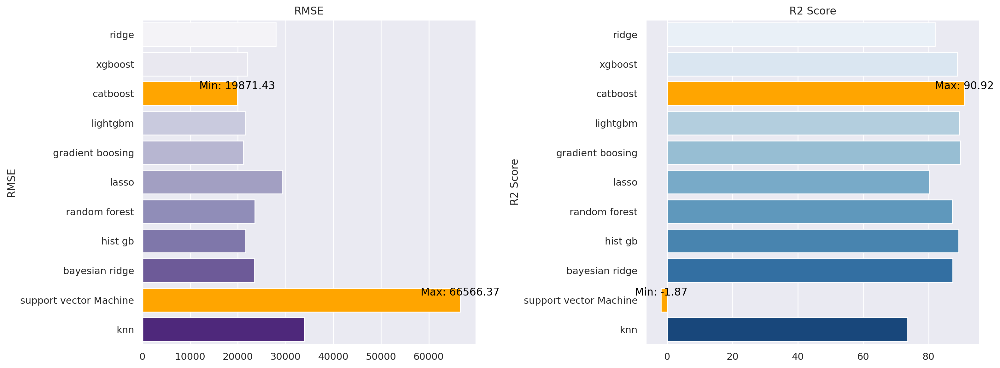

In [152]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=200)

# Plot for RMSE
ax_rmse = axes[0]
names = list(results_val.keys())
rmse = [score[0] for score in results_val.values()]
sns.barplot(x=rmse, y=names, ax=ax_rmse, palette = 'Purples', orient='h')
ax_rmse.set_title('RMSE')
ax_rmse.set_ylabel('RMSE')

# Find index of minimum RMSE
min_rmse_index = rmse.index(min(rmse))
# Annotate the bar with minimum RMSE
ax_rmse.annotate(f'Min: {min(rmse):.2f}', xy=(min(rmse), min_rmse_index), xytext=(0, 5), textcoords='offset points',
                 ha='center', color='Black')

# Find index of maximum RMSE
max_rmse_index = rmse.index(max(rmse))
# Annotate the bar with maximum RMSE
ax_rmse.annotate(f'Max: {max(rmse):.2f}', xy=(max(rmse), max_rmse_index), xytext=(0, 5), textcoords='offset points',
                 ha='center', color='Black')

# Highlight bars with minimum and maximum RMSE
ax_rmse.patches[min_rmse_index].set_facecolor('orange')
ax_rmse.patches[max_rmse_index].set_facecolor('orange')



# Plot for R2 Score
ax_r2 = axes[1]
r2score = [score[1] * 100 for score in results_val.values()]
sns.barplot(x=r2score, y=names, ax=ax_r2, palette = 'Blues', orient='h')
ax_r2.set_title('R2 Score')
ax_r2.set_ylabel('R2 Score')

# Find index of minimum R2 Score
min_r2score_index = r2score.index(min(r2score))
# Annotate the bar with minimum R2 Score
ax_r2.annotate(f'Min: {min(r2score):.2f}', xy=(min(r2score), min_r2score_index), xytext=(0, 5), textcoords='offset points',
                ha='center', color='Black')

# Find index of maximum R2 Score
max_r2score_index = r2score.index(max(r2score))
# Annotate the bar with maximum R2 Score
ax_r2.annotate(f'Max: {max(r2score):.2f}', xy=(max(r2score), max_r2score_index), xytext=(0, 5), textcoords='offset points',
                ha='center', color='Black')

# Highlight bars with minimum and maximum R2 Score
ax_r2.patches[min_r2score_index].set_facecolor('orange')
ax_r2.patches[max_r2score_index].set_facecolor('orange')

plt.tight_layout()
plt.show()

In [ ]:
# def catboost_objective(trial):
#     learning_rate = trial.suggest_float('learning_rate', 0, 0.5)
#     depth = trial.suggest_int('depth', 3, 10)
#     n_estimators = trial.suggest_int('n_estimators', 50, 600)
    
#     model = CatBoostRegressor(
#         learning_rate= learning_rate,
#         depth= depth,
#         n_estimators= n_estimators,
#         verbose= 0
#     )

#     model.fit(x_train, y_train)
#     rmse = math.sqrt(mean_squared_error(y_val, model.predict(x_val)))

#     return rmse

# study_1 = optuna.create_study(direction= 'minimize')
# study_1.optimize(catboost_objective, n_trials= 100)

In [104]:
# def lightgbm_objective(trial):
#     learning_rate = trial.suggest_float('learning_rate', 0, 0.5)
#     n_estimators = trial.suggest_int('n_estimators', 50, 600)
#     max_depth = trial.suggest_int('max_depth', 5, 30),
#     num_leaves = trial.suggest_int('num_leaves', 15, 60)

#     model = LGBMRegressor(
#         learning_rate= learning_rate,
#         n_estimators= n_estimators,
#         max_depth= max_depth,
#         num_leaves= num_leaves
#     )

#     model.fit(x_train, y_train)
#     rmse = math.sqrt(mean_squared_error(y_val, model.predict(x_val)))

#     return rmse

# study_2 = optuna.create_study(direction= 'minimize')
# study_2.optimize(lightgbm_objective, n_trials= 100)

In [105]:
# def histgbm_objective(trial):
#     learning_rate = trial.suggest_float('learning_rate', 0, 0.5)
#     max_iter = trial.suggest_int('max_iter', 50, 600)
#     max_depth = trial.suggest_int('max_depth', 5, 50)
#     max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 15, 60)
#     tol = trial.suggest_loguniform('tol', 1e-7, 0.1)

#     model = HistGradientBoostingRegressor(
#         learning_rate= learning_rate,
#         max_iter= max_iter,
#         max_depth= max_depth,
#         tol=tol,
#         max_leaf_nodes= max_leaf_nodes
#     )

#     model.fit(x_train, y_train)
#     rmse = math.sqrt(mean_squared_error(y_val, model.predict(x_val)))

#     return rmse

# study_3 = optuna.create_study(direction= 'minimize')
# study_3.optimize(histgbm_objective, n_trials= 100)

In [106]:
# def xgboost_objective(trial):
#     eta = trial.suggest_float('eta', 0, 1)
#     max_depth = trial.suggest_int('max_depth', 5, 50)
#     n_estimators = trial.suggest_int('n_estimators', 50, 600)

#     model = XGBRegressor(
#         eta= eta,
#         n_estimators= n_estimators,
#         max_depth= max_depth,
#     )

#     model.fit(x_train, y_train)
#     rmse = math.sqrt(mean_squared_error(y_val, model.predict(x_val)))

#     return rmse

# study_4 = optuna.create_study(direction= 'minimize')
# study_4.optimize(xgboost_objective, n_trials= 100)

In [107]:
# def gbr_objective(trial):
#     learning_rate = trial.suggest_float('learning_rate', 0, 0.5)
#     max_depth = trial.suggest_int('max_depth', 5, 50)
#     n_estimators = trial.suggest_int('n_estimators', 50, 600)

#     model = GradientBoostingRegressor(
#         learning_rate= learning_rate,
#         n_estimators= n_estimators,
#         max_depth= max_depth
#     )

#     model.fit(x_train, y_train)
#     rmse = math.sqrt(mean_squared_error(y_val, model.predict(x_val)))

#     return rmse

# study_4 = optuna.create_study(direction= 'minimize')
# study_4.optimize(gbr_objective, n_trials= 100)

In [108]:
catboost_params = {'learning_rate': 0.20050681644948193, 'depth': 6, 'n_estimators': 144} # RMSE: 22701.06305873002
    
lightgbm_params = {'learning_rate': 0.10448241504414651, 'n_estimators': 489, 'max_depth': 12, 'num_leaves': 22} # RMSE: 22777.984840667617

histgbm_params = {'learning_rate': 0.042890903838414235, 'max_iter': 585, 'max_depth': 5, 'max_leaf_nodes': 22, 'tol': 7.592009851227862e-05} # RMSE : 23269.339606979003

xgboost_params = {'eta': 0.11465410684370993, 'max_depth': 5, 'n_estimators': 176} # RMSE: 22842.711484764874\

grb_params = {'learning_rate': 0.028298221132953896, 'max_depth': 5, 'n_estimators': 305} # RMSE: 23026.347845872573

In [109]:
final_models = {
    'xgboost' : XGBRegressor(**xgboost_params),
    'catboost' : CatBoostRegressor(**catboost_params),
    'lightgbm' : LGBMRegressor(**lightgbm_params),
    'hist gb' : HistGradientBoostingRegressor(**histgbm_params),
    'gbr' : GradientBoostingRegressor(**grb_params)
}

In [110]:
for name, model in final_models.items():
    print(name, 'Training Starts')
    model.fit(x_train, y_train)
    print(name, 'Training Completed \n')

xgboost Training Starts
xgboost Training Completed 

catboost Training Starts
0:	learn: 58694.7517774	total: 4.82ms	remaining: 690ms
1:	learn: 51121.9531623	total: 8.75ms	remaining: 622ms
2:	learn: 45486.3566625	total: 12.5ms	remaining: 587ms
3:	learn: 40478.0693810	total: 16.1ms	remaining: 563ms
4:	learn: 36764.9577435	total: 19.7ms	remaining: 547ms
5:	learn: 33446.9856410	total: 23.6ms	remaining: 543ms
6:	learn: 31094.6362196	total: 27.6ms	remaining: 540ms
7:	learn: 28984.5655712	total: 31.5ms	remaining: 536ms
8:	learn: 27200.7457297	total: 35.3ms	remaining: 530ms
9:	learn: 25757.1967618	total: 38.9ms	remaining: 521ms
10:	learn: 24708.6677471	total: 42.6ms	remaining: 515ms
11:	learn: 23590.3404289	total: 46.4ms	remaining: 510ms
12:	learn: 22741.2662352	total: 49.9ms	remaining: 503ms
13:	learn: 21969.7202862	total: 53.7ms	remaining: 499ms
14:	learn: 21376.5644604	total: 58.2ms	remaining: 501ms
15:	learn: 20834.3103237	total: 62ms	remaining: 496ms
16:	learn: 20348.6764443	total: 66ms	r

In [111]:
final_predictions = (
    0.20 * final_models['catboost'].predict(test) +
    0.20 * final_models['xgboost'].predict(test) +
    0.20 * final_models['lightgbm'].predict(test) + 
    0.20 * final_models['hist gb'].predict(test) +
    0.20 * final_models['gbr'].predict(test)
)

In [112]:
final_rmse = {
    0.20 * math.sqrt(mean_squared_error(y_val, final_models['catboost'].predict(x_val))) +
    0.20 * math.sqrt(mean_squared_error(y_val, final_models['xgboost'].predict(x_val))) +
    0.20 * math.sqrt(mean_squared_error(y_val, final_models['lightgbm'].predict(x_val))) + 
    0.20 * math.sqrt(mean_squared_error(y_val, final_models['hist gb'].predict(x_val))) +
    0.20 * math.sqrt(mean_squared_error(y_val, final_models['gbr'].predict(x_val)))
}
print('Final RMSE Score: ',final_rmse)

Final RMSE Score:  {20913.184017555945}


In [113]:
final_r2_train = {
    0.20 * r2_score(y_train, final_models['catboost'].predict(x_train)) +
    0.20 * r2_score(y_train, final_models['xgboost'].predict(x_train)) +
    0.20 * r2_score(y_train, final_models['lightgbm'].predict(x_train)) + 
    0.20 * r2_score(y_train, final_models['hist gb'].predict(x_train)) + 
    0.20 * r2_score(y_train, final_models['gbr'].predict(x_train))
}
print('Final R2 Score: ',final_r2_train)

Final R2 Score:  {0.9935220973839989}


In [114]:
final_r2 = {
    0.20 * r2_score(y_val, final_models['catboost'].predict(x_val)) +
    0.20 * r2_score(y_val, final_models['xgboost'].predict(x_val)) +
    0.20 * r2_score(y_val, final_models['lightgbm'].predict(x_val)) + 
    0.20 * r2_score(y_val, final_models['hist gb'].predict(x_val)) + 
    0.20 * r2_score(y_val, final_models['gbr'].predict(x_val))
}
print('Final R2 Score: ',final_r2)

Final R2 Score:  {0.8994155547564222}


In [115]:
x_columns = x_train.columns
feature_rank = pd.DataFrame({'Feature': x_columns, 'Importances (in Percentage)': final_models['catboost'].feature_importances_})
feature_rank = feature_rank.sort_values('Importances (in Percentage)', ascending=False)
feature_rank.head(20)

,Feature,Importances (in Percentage)
2,OverallQual,22.411258
14,GrLivArea,17.631117
10,TotalBsmtSF,8.265938
4,YearBuilt,6.003556
17,FullBath,4.076081
7,BsmtFinSF1,4.001288
24,GarageCars,3.549562
1,LotArea,2.930744
22,Fireplaces,2.822859
3,OverallCond,2.148248


In [116]:
feature_rank['Cum_sum (in Percentage)'] = feature_rank['Importances (in Percentage)'].cumsum()
feature_rank.head(20)

,Feature,Importances (in Percentage),Cum_sum (in Percentage)
2,OverallQual,22.411258,22.411258
14,GrLivArea,17.631117,40.042375
10,TotalBsmtSF,8.265938,48.308313
4,YearBuilt,6.003556,54.311869
17,FullBath,4.076081,58.387950
7,BsmtFinSF1,4.001288,62.389238
24,GarageCars,3.549562,65.938800
1,LotArea,2.930744,68.869544
22,Fireplaces,2.822859,71.692403
3,OverallCond,2.148248,73.840651


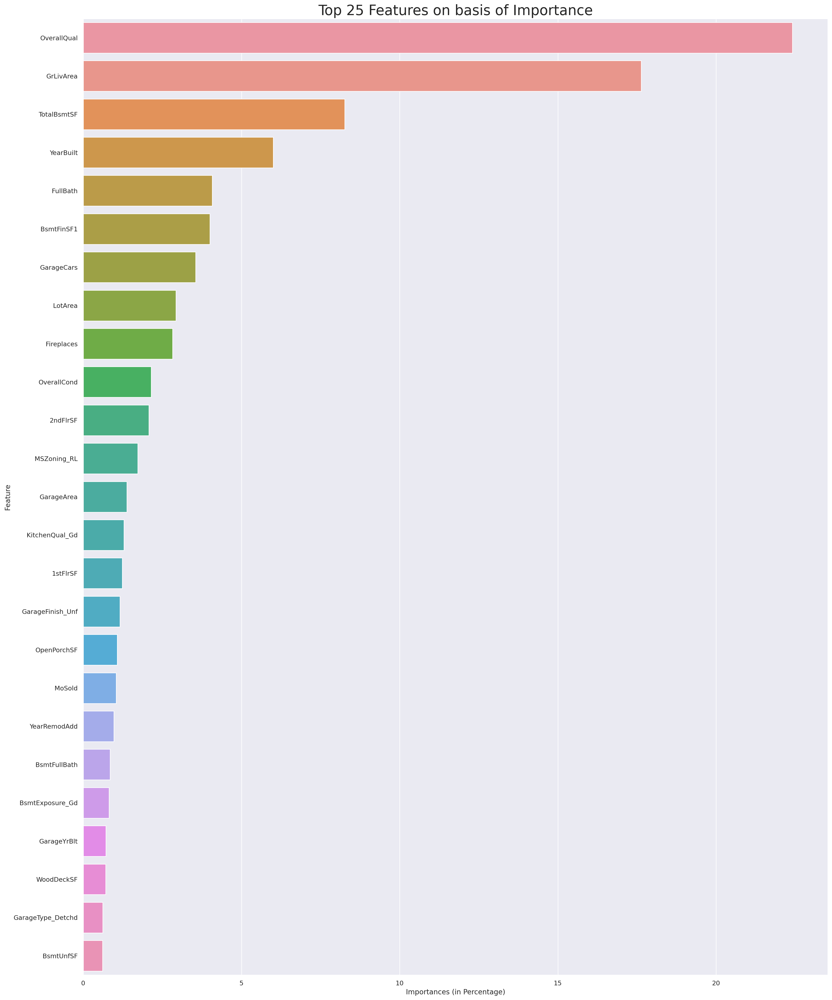

In [117]:
plt.figure(figsize=(20,24), dpi = 200)
plt.title('Top 25 Features on basis of Importance', fontsize = 24)
sns.barplot(x='Importances (in Percentage)', y='Feature', data=feature_rank.iloc[:25, :])
plt.tight_layout()
plt.show()

In [119]:
final_test = pd.DataFrame({'Id': test_ids, 'SalePrice': final_predictions})
final_test.head()

,Id,SalePrice
0,1461,120201.119566
1,1462,156100.261809
2,1463,186412.849632
3,1464,190042.315349
4,1465,183837.117122


<Axes: xlabel='Id', ylabel='SalePrice'>

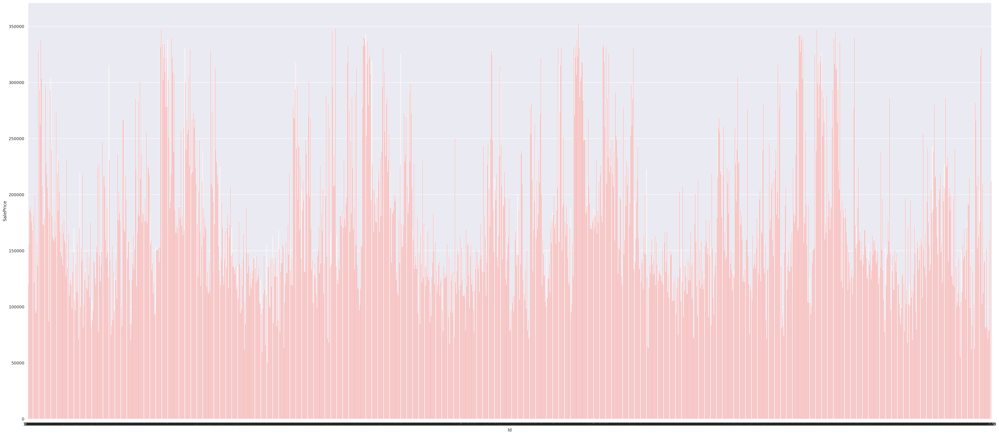

In [157]:
fig = plt.figure(figsize=(46, 20), dpi = 200)
sns.barplot(x = 'Id', y = 'SalePrice', data = final_test, color ='red')

In [ ]:
final_test.to_csv('submission.csv', index=None)